# Projet 2 : Évaluation Comparative de Méthodes de Segmentation et Estimation de la Sévérité des Maladies Foliaires dans les Cultures de Café

## Introduction

L'agriculture, étant le pilier de notre économie, est confrontée à des défis constants liés aux maladies foliaires affectant les cultures. L'identification précoce et la segmentation précise des zones touchées sont essentielles pour minimiser les pertes de récoltes et appliquer des traitements ciblés. Dans ce contexte, notre projet se concentre sur l'évaluation comparative de différentes méthodes de segmentation, notamment l'utilisation d'un seuillage itératif, de l'algorithme K-means, et l'approche moderne de segmentation avec le modèle U-Net. De plus, nous explorons une nouvelle métrique basée sur la précision de la segmentation, définie par le Recognition Working Group (ATRWG), pour évaluer la performance des algorithmes.

Après la segmentation, nous évaluons la sévérité des maladies foliaires en adoptant une approche basée sur le comptage des pixels appartenant à la zone touchée de la feuille. Cette méthode objective nous permet de quantifier la gravité de la maladie de manière précise.

## Méthodologie

### Segmentation

Nous avons appliqué trois approches de segmentation, à savoir le seuillage itératif, l'algorithme K-means, et le modèle U-Net. La métrique de précision de segmentation, Qseg, a été employée pour évaluer la performance de chaque méthode. La formule de Qseg compare la segmentation générée par l'algorithme sous évaluation avec la segmentation manuelle optimale.
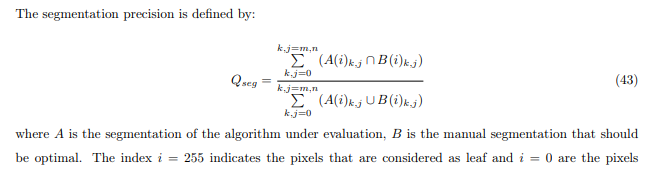

### Estimation de la Sévérité

La sévérité des maladies foliaires a été évaluée en comptant les pixels appartenant à la zone touchée de la feuille. Cette approche quantitative fournit une évaluation objective de l'étendue des dommages.

#Import Necessary Libraries

In [23]:
import os
import cv2
import colorsys
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.exceptions import UndefinedMetricWarning
import warnings
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.utils import shuffle
from tensorflow.keras.utils import image_dataset_from_directory
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow import keras
from PIL import Image
import random
from skimage import color, filters, segmentation
import tensorflow as tf
from tensorflow.keras import layers

In [24]:
# Specify the path to the folder containing your images
folder_path = '/content/train/'

# Get a list of all image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

# Create an empty list to store image information
image_data_list = []

# Loop through each image file
for image_file in image_files:
    image_data_list.append({
        'Image File': image_file
    })

# Create a DataFrame from the list
image_data = pd.DataFrame(image_data_list)

# Display the DataFrame
print(image_data)

   Image File
0      21.jpg
1     349.jpg
2    1680.jpg
3    1016.jpg
4     866.jpg
5     268.jpg
6       2.jpg
7     242.jpg
8     419.jpg
9     371.jpg
10    488.jpg
11   1034.jpg
12    330.jpg
13    395.jpg
14   1074.jpg
15    771.jpg
16    218.jpg
17    992.jpg
18    712.jpg
19   1643.jpg
20    627.jpg
21     68.jpg
22   1541.jpg
23    443.jpg
24   1383.jpg
25     47.jpg
26    960.jpg
27   1705.jpg
28    694.jpg
29    828.jpg
30    529.jpg
31   1573.jpg
32    146.jpg
33    680.jpg
34    901.jpg
35   1105.jpg
36    742.jpg
37   1413.jpg
38   1481.jpg
39    446.jpg
40    792.jpg
41   1201.jpg
42   1612.jpg
43     88.jpg
44   1449.jpg
45    628.jpg
46   1517.jpg
47    291.jpg
48    862.jpg
49    566.jpg


#Exploratory Data Analysis

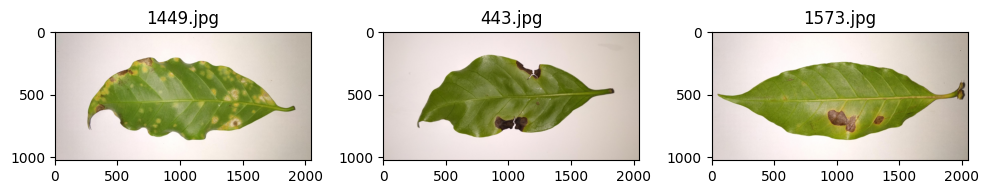

In [25]:
# Select three random images from the DataFrame
random_images = image_data.sample(n=3)

# Plot the three random images
fig, axes = plt.subplots(1, 3, figsize=(10, 4))

for idx in range(3):
    row = random_images.iloc[idx]
    img_path = os.path.join(folder_path, row['Image File'])
    img = Image.open(img_path)
    axes[idx].imshow(img)
    axes[idx].set_title(row['Image File'])

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

# Leaf Segmentation

## Transform the input image into the HSV or YCbCr color space

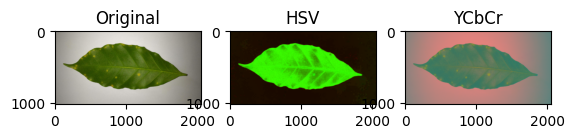

In [26]:
# Load the image
image_path = '/content/101.jpg'
img = cv2.imread(image_path)

# Convert to HSV using colorsys.rgb_to_hsv()
def rgb_to_hsv(rgb):
    r, g, b = rgb / 255.0
    h, s, v = colorsys.rgb_to_hsv(r, g, b)
    return h, s, v

# Apply rgb_to_hsv element-wise to the image
hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) / 255.0
hsv_image = np.array([rgb_to_hsv(rgb) for rgb in hsv_image.reshape(-1, 3)])
hsv_image = (255 * hsv_image.reshape(img.shape)).astype(np.uint8)

# Convert to YCbCr color space
ycbcr_image = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

# Display the original, HSV, and YCbCr images
plt.subplot(131), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(132), plt.imshow(hsv_image, cmap='hsv'), plt.title('HSV')
plt.subplot(133), plt.imshow(ycbcr_image), plt.title('YCbCr')
plt.show()


In [27]:
!rm -r /content/predictions_train

rm: cannot remove '/content/predictions_train': No such file or directory


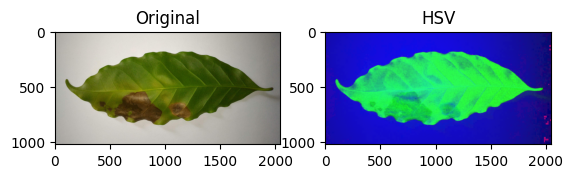

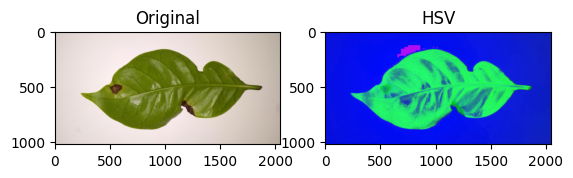

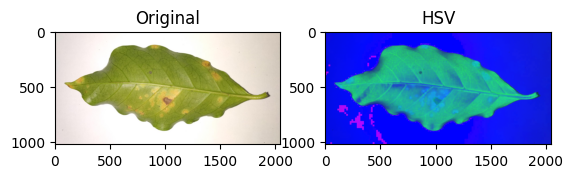

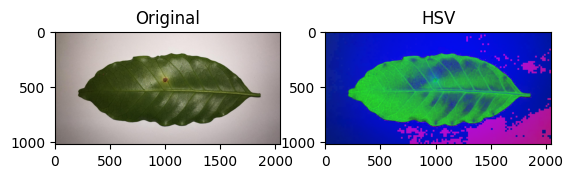

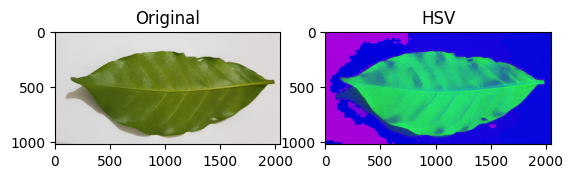

...

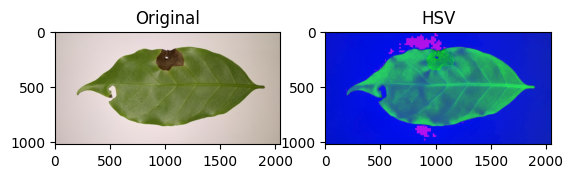

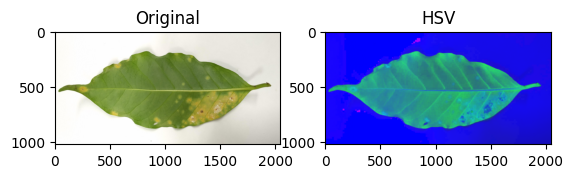

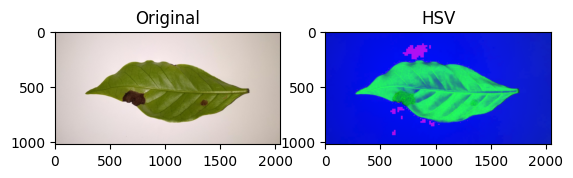

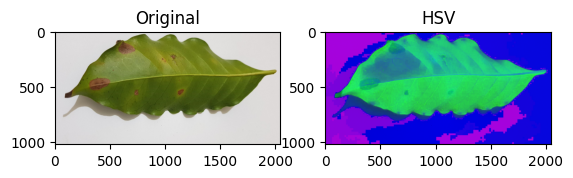

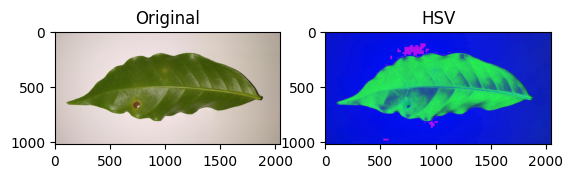

Conversion completed.


In [28]:
# Path to the input folder containing images
input_folder = '/content/train'

# Path to the output folder to save HSV images
output_folder = '/content/train_hsv'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Iterate through each image in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        # Load the image
        image_path = os.path.join(input_folder, filename)
        img = cv2.imread(image_path)

        # Convert to HSV
        hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

        # Save the HSV image to the output folder
        output_path = os.path.join(output_folder, filename)
        cv2.imwrite(output_path, hsv_image)

        # Display the original and HSV images
        plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
        plt.subplot(122), plt.imshow(hsv_image, cmap='hsv'), plt.title('HSV')
        plt.show()

print("Conversion completed.")


##  Apply the Otsu method &  Apply the threshold to get the binary image

In [29]:
def apply_otsu(input_folder, output_folder):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    results = []

    # Iterate through each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            # Load the image
            img_path = os.path.join(input_folder, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            # Apply Otsu's method
            _, threshold_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            # Save the thresholded image to the output folder
            output_path = os.path.join(output_folder, f"thresholded_{filename}")
            cv2.imwrite(output_path, threshold_img)

            # Store results
            results.append({'filename': filename, 'original': img, 'thresholded': threshold_img})

    return results

In [30]:
def display_results(results):
    for result in results:
        filename = result['filename']
        original_img = result['original']
        thresholded_img = result['thresholded']

        # Display the original and thresholded images side by side
        plt.figure(figsize=(8, 4))
        plt.subplot(121), plt.imshow(original_img, cmap='gray'), plt.title('Original Image')
        plt.subplot(122), plt.imshow(thresholded_img, cmap='gray'), plt.title('Thresholded Image')
        plt.suptitle(f'Results for {filename}')
        plt.show()

In [31]:
# Specify the input and output folders
input_folder = '/content/train_hsv'
output_folder = '/content/train_otsu'

# Apply Otsu's method and get results
results = apply_otsu(input_folder, output_folder)

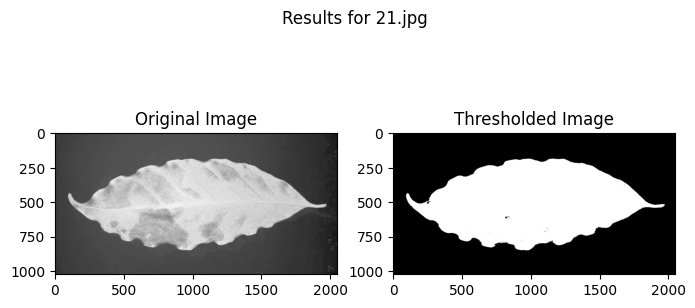

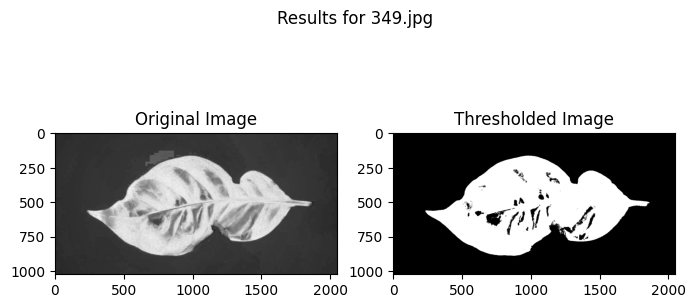

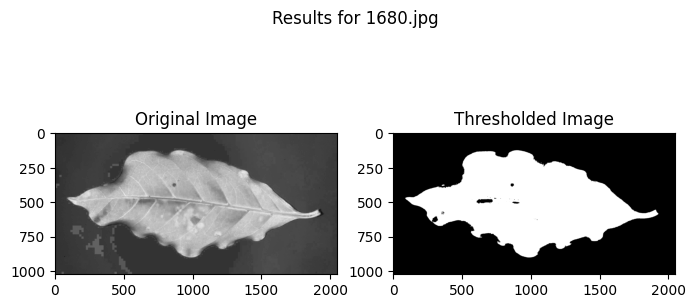

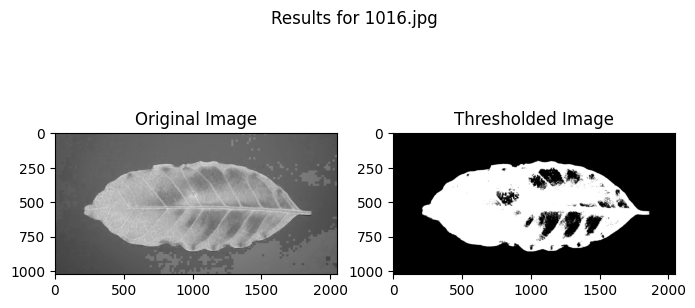

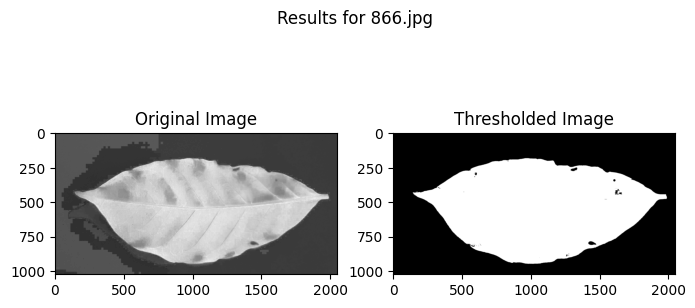

...

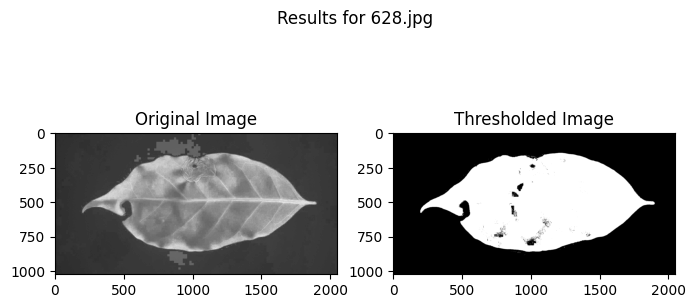

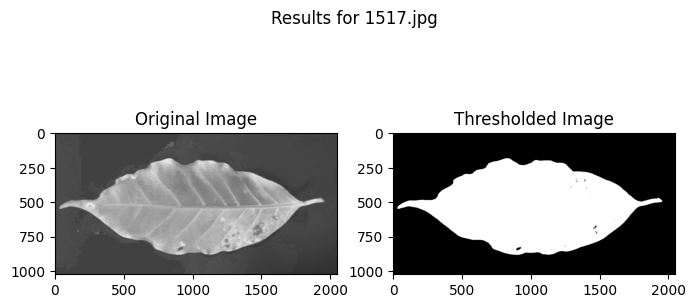

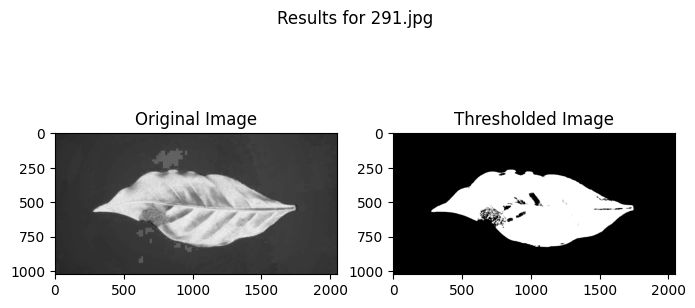

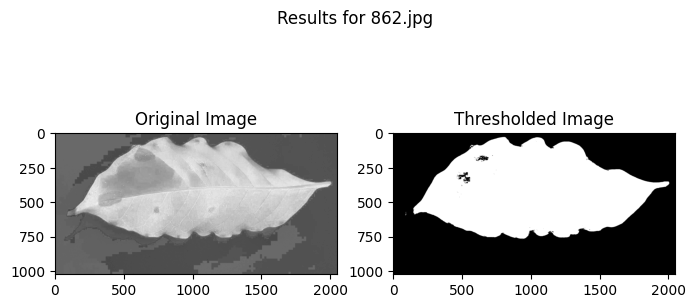

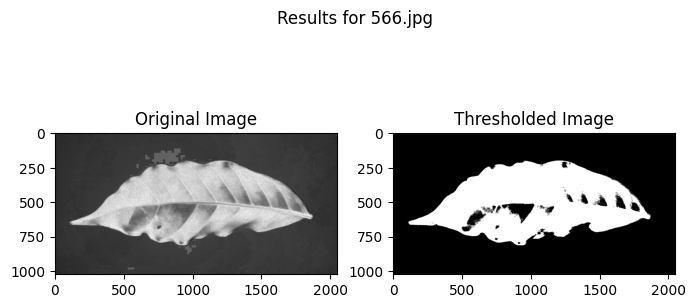

In [32]:
# Display the results
display_results(results)

## Apply the morphological operations of opening and closing for elimination of noise and filling of failures in the binary image

In [33]:
def apply_morphological_operations(input_folder, output_folder, kernel_size=5):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Define the kernel for morphological operations
    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    # Iterate over each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(".jpg"):
            # Load the binary image
            binary_image_path = os.path.join(input_folder, filename)
            binary_img = cv2.imread(binary_image_path, cv2.IMREAD_GRAYSCALE)

            # Apply opening operation to remove noise
            opening_img = cv2.morphologyEx(binary_img, cv2.MORPH_OPEN, kernel)

            # Apply closing operation to fill gaps or holes
            closing_img = cv2.morphologyEx(opening_img, cv2.MORPH_CLOSE, kernel)

            # Additional morphological operations for refinement
            eroded_img = cv2.erode(closing_img, kernel, iterations=1)
            dilated_img = cv2.dilate(eroded_img, kernel, iterations=1)

            # Save the result in the output folder
            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, dilated_img)

            # Display the original and processed images
            plt.subplot(121), plt.imshow(binary_img, cmap='gray'), plt.title('Original Binary')
            plt.subplot(122), plt.imshow(dilated_img, cmap='gray'), plt.title('Processed Image')
            plt.show()


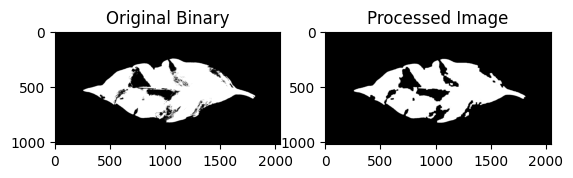

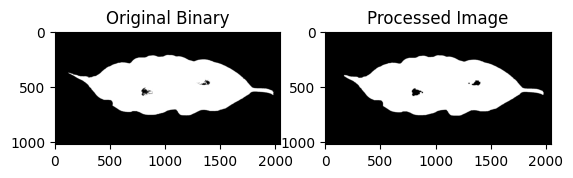

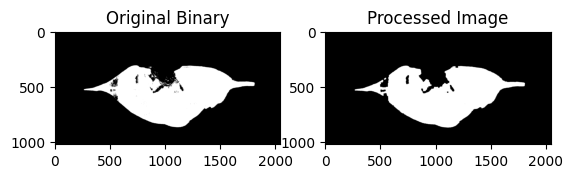

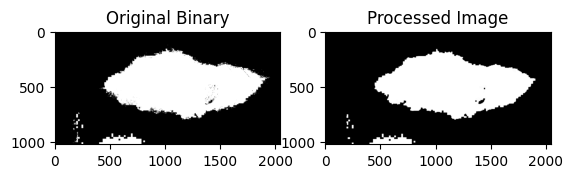

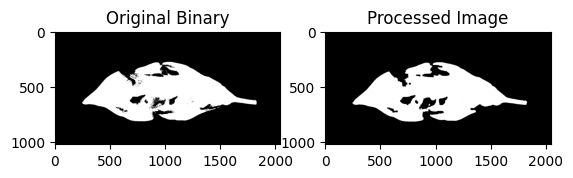

...

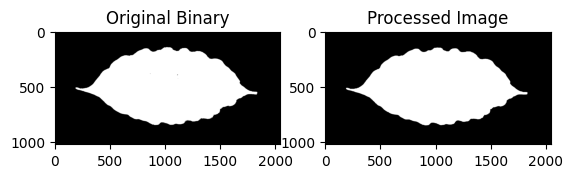

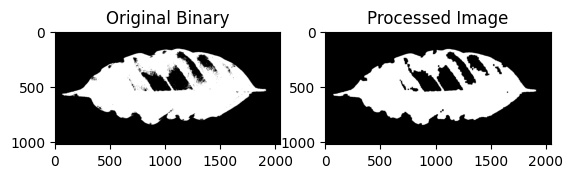

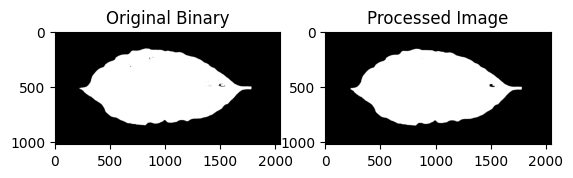

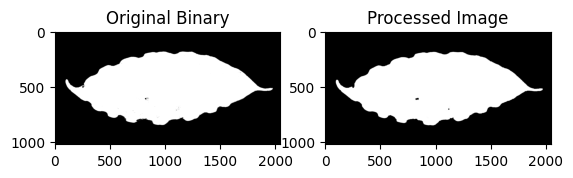

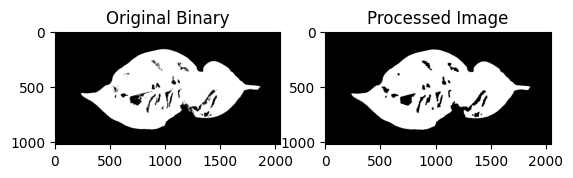

In [34]:
if __name__ == "__main__":
    # Set the paths for input and output folders
    input_folder_path = '/content/train_otsu'
    output_folder_path = '/content/morpho_train'

    # Specify the kernel size
    kernel_size = 10
    # Call the function
    apply_morphological_operations(input_folder_path, output_folder_path, kernel_size)

## Leaf Extraction

In [35]:
# Input and output folders
input_folder = '/content/train/'
output_folder = '/content/segmented_output/'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Loop through each file in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        # Load the original image
        original_image_path = os.path.join(input_folder, filename)
        original_img = cv2.imread(original_image_path)

        # Load the binary image (after applying Otsu's method and morphological operations)
        binary_image_path = os.path.join('/content/morpho_train/', 'thresholded_' + filename)
        segmented_img = cv2.imread(binary_image_path, cv2.IMREAD_GRAYSCALE)

        # Find contours in the segmented image
        contours, _ = cv2.findContours(segmented_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Create a mask for the leaf region
        leaf_mask = np.zeros_like(original_img[:, :, 0], dtype=np.uint8)

        # Draw the contours on the mask
        cv2.drawContours(leaf_mask, contours, -1, (255), thickness=cv2.FILLED)

        # Apply the mask to the original image to extract the leaf
        extracted_leaf = cv2.bitwise_and(original_img, original_img, mask=leaf_mask)

        # Save the result in the output folder
        output_path = os.path.join(output_folder, filename)
        cv2.imwrite(output_path, extracted_leaf)

# Print a message when processing is complete
print("Segmentation completed for all images.")


Segmentation completed for all images.


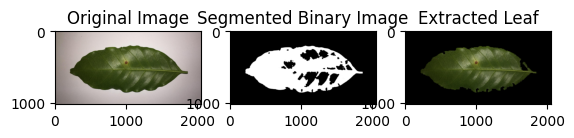

In [36]:
# Load the original image
original_image_path = '/content/train/1016.jpg'
original_img = cv2.imread(original_image_path)

# Load the binary image (after applying Otsu's method and morphological operations)
binary_image_path = '/content/morpho_train/thresholded_1016.jpg'
segmented_img = cv2.imread(binary_image_path, cv2.IMREAD_GRAYSCALE)

# Convert the segmented_img to float32
segmented_img = segmented_img.astype(np.float32) / 255.0

# Find contours in the segmented image
contours, _ = cv2.findContours(segmented_img.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create a mask for the leaf region
leaf_mask = np.zeros_like(original_img[:, :, 0], dtype=np.uint8)

# Draw the contours on the mask
cv2.drawContours(leaf_mask, contours, -1, (255), thickness=cv2.FILLED)

# Apply the mask to the original image to extract the leaf
extracted_leaf = cv2.bitwise_and(original_img, original_img, mask=leaf_mask)

# Display the original image, segmented image, and extracted leaf
plt.subplot(131), plt.imshow(original_img[:, :, ::-1]), plt.title('Original Image')
plt.subplot(132), plt.imshow(segmented_img, cmap='gray'), plt.title('Segmented Binary Image')
plt.subplot(133), plt.imshow(extracted_leaf[:, :, ::-1]), plt.title('Extracted Leaf')
plt.show()


# Damaged foliar area Segmentation

## Using k-means algorithm

In [37]:
def visualize_single_cluster_ycbcr(input_folder, output_folder, cluster_index=0):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Iterate over each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(".jpg"):
            # Load the original image
            original_img = cv2.imread(os.path.join(input_folder, filename))

            # Convert the original image to the YCbCr color space
            ycbcr_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2YCrCb)

            # Reshape the image to a 2D array of pixels
            pixels = ycbcr_img.reshape((-1, 3))

            # Apply k-means clustering
            kmeans = KMeans(n_clusters=4)
            kmeans.fit(pixels)

            # Get the cluster center for the specified index
            cluster_center = kmeans.cluster_centers_[cluster_index]

            # Assign each pixel to its corresponding cluster center
            segmented_img = kmeans.cluster_centers_[kmeans.labels_]

            # Set pixels of other clusters to white
            segmented_img[kmeans.labels_ != cluster_index] = [0,0, 0]

            # Reshape the segmented image back to the original shape
            segmented_img = segmented_img.reshape(original_img.shape)


            # Save the result in the output folder
            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, segmented_img)


In [38]:
input_folder = '/content/segmented_output/'
output_folder = '/content/K_means_segmentation/'
visualize_single_cluster_ycbcr(input_folder, output_folder, cluster_index=2)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

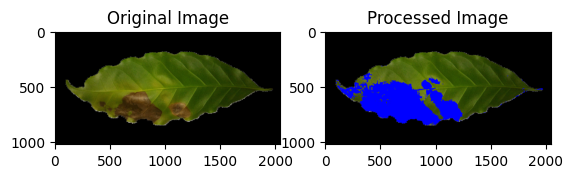

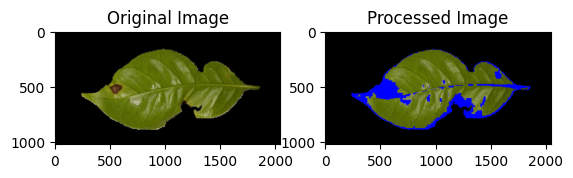

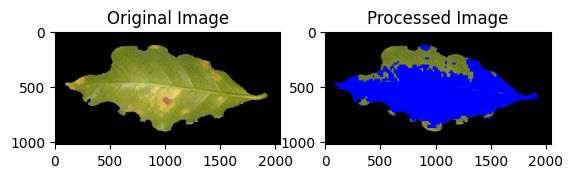

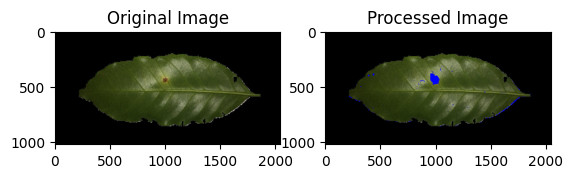

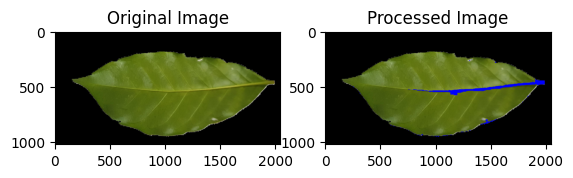

...

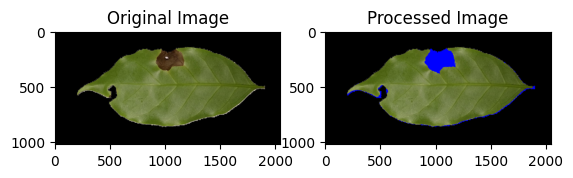

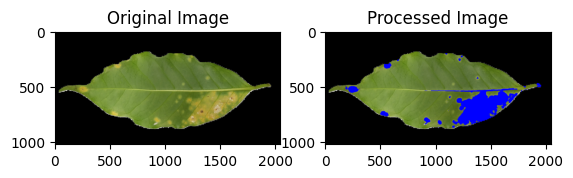

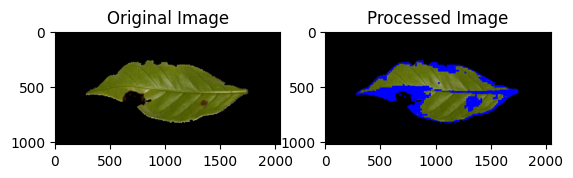

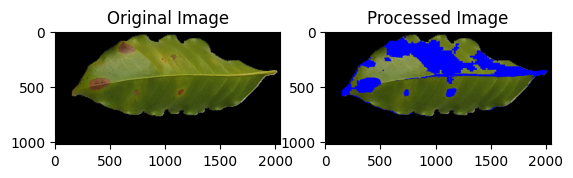

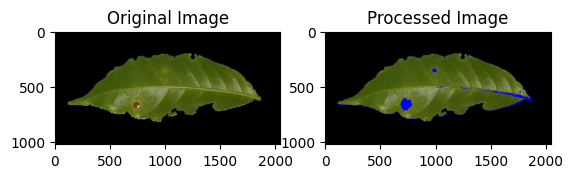

In [39]:
def overlay_spots(original_image, binary_mask):
    # Create an RGB image for visualization
    overlay_image = np.copy(original_image)

    # Create a mask for the damaged spots (blue)
    blue_mask = np.zeros_like(original_image, dtype=np.uint8)
    blue_mask[binary_mask == 255] = [255, 0, 0]

    # Overlay blue mask on the original image
    overlay_image[np.all(blue_mask == [255, 0, 0], axis=-1)] = [255, 0, 0]

    return overlay_image

def visualize_single_cluster_kmeans(input_folder, output_folder, cluster_index=0):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Iterate over each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(".jpg"):
            # Load the original image
            original_img = cv2.imread(os.path.join(input_folder, filename))

            # Convert the original image to the YCbCr color space
            ycbcr_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2YCrCb)

            # Extract the Cr channel
            cr_channel = ycbcr_img[:, :, 1]

            # Apply a simple threshold to create a binary mask
            _, binary_mask = cv2.threshold(cr_channel, 129, 255, cv2.THRESH_BINARY)

            # Overlay spots on the original image
            overlay_result = overlay_spots(original_img, binary_mask)

            # Save the result in the output folder
            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, overlay_result)
            # Display the original and processed images
            plt.subplot(121), plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
            plt.subplot(122), plt.imshow(cv2.cvtColor(overlay_result, cv2.COLOR_BGR2RGB)), plt.title('Processed Image')
            plt.show()


# Example usage:
input_folder_example = '/content/segmented_output/'
output_folder_example = '/content/K_means_segmentation_overlay/'
visualize_single_cluster_kmeans(input_folder_example, output_folder_example, cluster_index=3)


## Using Iterative threshold segmentation method applied in the converted image to the YCgCr color space

In [40]:
def iterative_thresholding(image_path, max_iterations=300, convergence_threshold=0.001):
    # Load the image using OpenCV
    img = cv2.imread(image_path)

    # Convert the image to the YCbCr color space
    ycbcr_image = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

    # Extract the Cr channel from the YCbCr image
    cr_channel = ycbcr_image[:, :, 1]

    # Initialize threshold
    T = 129.0

    for _ in range(max_iterations):
        # Divide the Cr channel into two groups
        G1 = cr_channel > T
        G2 = cr_channel <= T

        # Calculate the mean values for each group
        m1 = np.mean(cr_channel[G1])
        m2 = np.mean(cr_channel[G2])

        # Update the threshold using the mean values
        new_T = (m1 + m2) / 2.0

        # Check for convergence
        if abs(T - new_T) < convergence_threshold:
            break

        T = new_T

    # Apply the final threshold to get the binary image
    _, binary_image = cv2.threshold(cr_channel, T, 255, cv2.THRESH_BINARY)

    return binary_image

In [41]:
def overlay_spots_and_leaf(original_image, binary_image):
    # Create an RGB image for visualization
    overlay_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Create a mask for the spots (red)
    red_mask = np.zeros_like(binary_image)
    red_mask[binary_image == 255] = 255

    # Create a mask for the background (blue)
    blue_mask = np.zeros_like(binary_image)
    blue_mask[binary_image == 0] = 255

    # Preserve the background color in the overlay image
    overlay_image[blue_mask == 255] = original_image[blue_mask == 255]

    # Apply red mask to the spots
    overlay_image[:, :, 2] |= red_mask  # Red channel

    return overlay_image

In [42]:
def process_images(input_folder, output_folder):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Loop through each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            # Construct the paths for input and output images
            input_image_path = os.path.join(input_folder, filename)
            output_image_path = os.path.join(output_folder, filename)

            # Apply iterative thresholding to the image
            binary_image_iterative = iterative_thresholding(input_image_path)

            # Load the original image
            original_image = cv2.imread(input_image_path)

            # Overlay spots (red) and leaf (green)
            overlay_result = overlay_spots_and_leaf(original_image, binary_image_iterative)

            # Save the result in the output folder
            cv2.imwrite(output_image_path, overlay_result)

            # Display the original and processed images
            plt.subplot(121), plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
            plt.subplot(122), plt.imshow(cv2.cvtColor(overlay_result, cv2.COLOR_BGR2RGB)), plt.title('Processed Image')
            plt.show()


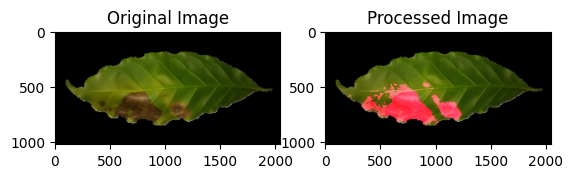

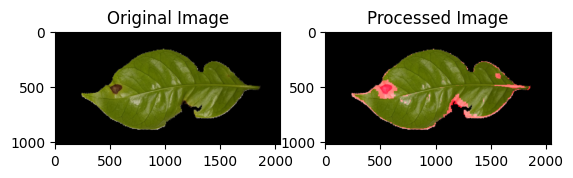

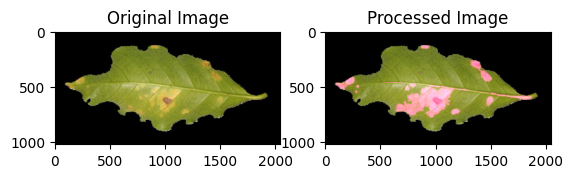

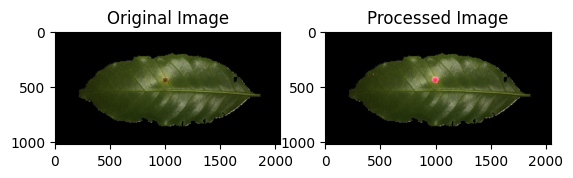

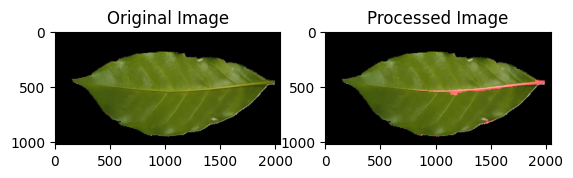

...

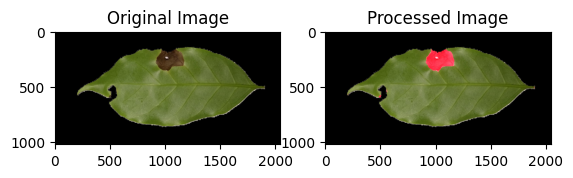

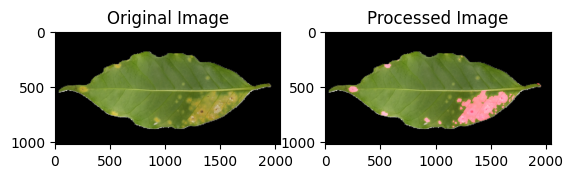

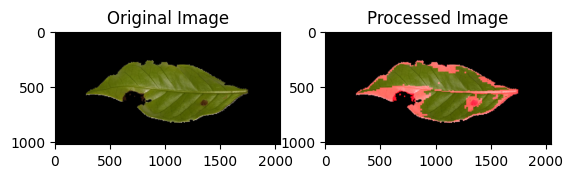

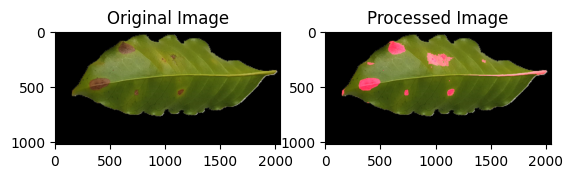

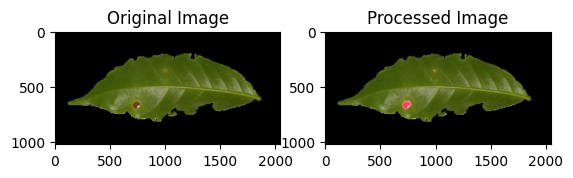

In [43]:
input_folder_example = '/content/segmented_output/'
output_folder_example = '/content/iterative_threshold_output/'

# Apply iterative thresholding to all images in the input folder and save results in the output folder
process_images(input_folder_example, output_folder_example)

## Using U-Net model

In [44]:
# Set the path to your image and mask folders
image_folder = '/content/train'
mask_folder = '/content/mask'
csv_file_path = '/content/dataset.csv'

csv_df = pd.read_csv(csv_file_path)

# Get the list of image file names
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png'))]
mask_files = [f for f in os.listdir(mask_folder) if f.endswith(('.jpg', '.png'))]

# Extract image ID from the file name and find corresponding severity values
severity_values = []

for image_file in image_files:
    image_id = int(os.path.splitext(image_file)[0])
    csv_row = csv_df[csv_df['id'] == image_id]

    if not csv_row.empty:
        # Extract severity value
        severity_value = csv_row['severity'].values[0]
        severity_values.append(severity_value)
    else:
        severity_values.append(None)

# Merge CSV data with image and mask file paths and severity values
df = pd.DataFrame({
    'image_path': [os.path.join(image_folder, img) for img in image_files],
    'mask_path': [os.path.join(mask_folder, img.replace('.jpg', '_mask.png')) for img in image_files],
    'severity': severity_values,
})

print(df)


                 image_path                    mask_path  severity
0     /content/train/21.jpg    /content/mask/21_mask.png         3
1    /content/train/349.jpg   /content/mask/349_mask.png         1
2   /content/train/1680.jpg  /content/mask/1680_mask.png         2
3   /content/train/1016.jpg  /content/mask/1016_mask.png         1
4    /content/train/866.jpg   /content/mask/866_mask.png         0
5    /content/train/268.jpg   /content/mask/268_mask.png         1
6      /content/train/2.jpg     /content/mask/2_mask.png         0
7    /content/train/242.jpg   /content/mask/242_mask.png         2
8    /content/train/419.jpg   /content/mask/419_mask.png         2
9    /content/train/371.jpg   /content/mask/371_mask.png         3
10   /content/train/488.jpg   /content/mask/488_mask.png         2
11  /content/train/1034.jpg  /content/mask/1034_mask.png         2
12   /content/train/330.jpg   /content/mask/330_mask.png         1
13   /content/train/395.jpg   /content/mask/395_mask.png      

In [45]:
def load_and_preprocess_image_with_mask(image_path, mask_path, target_height=128, target_width=128):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, [target_height, target_width])
    img = img / 255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_image(mask, channels=1)
    mask.set_shape([None, None, 1])
    mask = tf.image.resize(mask, [target_height, target_width])
    mask = mask / 255.0

    return img, mask

# Create a TensorFlow Dataset from the DataFrame
image_mask_dataset = tf.data.Dataset.from_tensor_slices((df['image_path'].values, df['mask_path'].values))
image_mask_dataset = image_mask_dataset.map(load_and_preprocess_image_with_mask)

In [46]:
def create_segmentation_model(input_shape):
    # Define the U-Net model
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D((2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D((2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D((2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)

    # Decoder
    up5 = layers.UpSampling2D((2, 2))(conv4)
    up5 = layers.Conv2D(256, (2, 2), activation='relu', padding='same')(up5)
    merge5 = layers.concatenate([conv3, up5], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(merge5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)

    up6 = layers.UpSampling2D((2, 2))(conv5)
    up6 = layers.Conv2D(128, (2, 2), activation='relu', padding='same')(up6)
    merge6 = layers.concatenate([conv2, up6], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(merge6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)

    up7 = layers.UpSampling2D((2, 2))(conv6)
    up7 = layers.Conv2D(64, (2, 2), activation='relu', padding='same')(up7)
    merge7 = layers.concatenate([conv1, up7], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(merge7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)

    # Output layer
    output_layer = layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(conv7)

    # Create and compile the model
    model = tf.keras.Model(inputs=inputs, outputs=output_layer)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Set the target dimensions for your images
target_height = 128
target_width = 128
input_shape = (target_height, target_width, 3)

# Create an instance of the segmentation model
segmentation_model = create_segmentation_model(input_shape)

# Display the model summary
segmentation_model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 64, 64, 64)           0         ['conv2d_1[0][0]']            
 D)                                                                                           

In [47]:
#Split Data
validation_split = 0.2
num_validation_samples = int(validation_split * len(df))

train_dataset = image_mask_dataset.skip(num_validation_samples)
validation_dataset = image_mask_dataset.take(num_validation_samples)


batch_size = 32

# Shuffle and batch the datasets
train_dataset = train_dataset.shuffle(buffer_size=len(df)).batch(batch_size)
validation_dataset = validation_dataset.batch(batch_size)

In [48]:
# Set up ModelCheckpoint callback to save weights during training
checkpoint_filepath = 'model_weights.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

In [49]:
# Train the model with the ModelCheckpoint callback
epochs = 10
segmentation_model.fit(
    train_dataset,
    epochs=epochs,
    validation_data=validation_dataset,
    callbacks=[model_checkpoint_callback])

Epoch 1/10
2/2 [==============================] - 40s 11s/step - loss: 0.6758 - accuracy: 0.4874 - val_loss: 0.7171 - val_accuracy: 0.6818
Epoch 2/10
2/2 [==============================] - 2s 454ms/step - loss: 0.6962 - accuracy: 0.6501 - val_loss: 0.5128 - val_accuracy: 0.6818
Epoch 3/10
2/2 [==============================] - 2s 485ms/step - loss: 0.5182 - accuracy: 0.6501 - val_loss: 0.4194 - val_accuracy: 0.6818
Epoch 4/10
2/2 [==============================] - 2s 603ms/step - loss: 0.4243 - accuracy: 0.6501 - val_loss: 0.2994 - val_accuracy: 0.6818
Epoch 5/10
2/2 [==============================] - 2s 347ms/step - loss: 0.3296 - accuracy: 0.6501 - val_loss: 0.3034 - val_accuracy: 0.6818
Epoch 6/10
2/2 [==============================] - 2s 435ms/step - loss: 0.3285 - accuracy: 0.6501 - val_loss: 0.2807 - val_accuracy: 0.6818
Epoch 7/10
2/2 [==============================] - 2s 410ms/step - loss: 0.3066 - accuracy: 0.6501 - val_loss: 0.2732 - val_accuracy: 0.6818
Epoch 8/10
2/2 [=====

In [50]:
# Save the final model weights
segmentation_model.save_weights('final_model_weights.h5')

In [64]:
import os
import matplotlib.pyplot as plt
import numpy as np

# Specify the folder where you want to save the segmented images
save_folder = '/content/segmentation_results'

# Create the folder if it doesn't exist
os.makedirs(save_folder, exist_ok=True)

# Fetch a batch of validation data
for images, labels in validation_dataset.take(1):
    # Make predictions using the trained model
    predictions = segmentation_model.predict(images)

    # Iterate through the batch
    for i in range(len(images)):
        # Print shapes and values for debugging
        print("Image shape:", images[i].shape)
        print("Label shape:", labels[i][:, :, 0].shape)
        print("Prediction shape:", predictions[i][:, :, 0].shape)
        print("Prediction values:", predictions[i][:, :, 0])

        # Plot the original image
        plt.subplot(1, 3, 1)
        plt.imshow(images[i])
        plt.title('Original Image')

        # Plot the ground truth mask (label)
        plt.subplot(1, 3, 2)
        plt.imshow(labels[i][:, :, 0], cmap='gray')
        plt.title('Ground Truth Mask')

        # Plot the predicted mask
        plt.subplot(1, 3, 3)
        plt.imshow(predictions[i][:, :, 0], cmap='gray')
        plt.title('Predicted Mask')

        # Convert the prediction array to an image
        prediction_image = Image.fromarray((predictions[i][:, :, 0] * 255).astype(np.uint8))

        # Save the image to the specified folder with a unique name
        save_path = os.path.join(save_folder, f'result_{i}.png')
        prediction_image.save(save_path)

        plt.close()  # Close the figure to avoid memory issues
# Display the saved images
print(f"Segmentation results saved in '{save_folder}' folder.")


1/1 [==============================] - 0s 20ms/step
Image shape: (128, 128, 3)
Label shape: (128, 128)
Prediction shape: (128, 128)
Prediction values: [[0.32334647 0.23318525 0.19983266 ... 0.30100402 0.334336   0.39199287]
 [0.24379666 0.1199595  0.08377533 ... 0.18657424 0.22633278 0.31160972]
 [0.19986844 0.08028522 0.04968998 ... 0.13632938 0.17575334 0.2679907 ]
 ...
 [0.20295772 0.08190745 0.04982194 ... 0.1140546  0.15076496 0.24480404]
 [0.23870388 0.10986722 0.07027353 ... 0.14183341 0.17920889 0.26983258]
 [0.34654757 0.23206891 0.17770898 ... 0.2480267  0.27585843 0.34109288]]
Image shape: (128, 128, 3)
Label shape: (128, 128)
Prediction shape: (128, 128)
Prediction values: [[0.28834426 0.18844378 0.15444967 ... 0.20628262 0.24971706 0.33369425]
 [0.19909868 0.07935733 0.05036015 ... 0.08574594 0.12121565 0.21944879]
 [0.15348704 0.04731101 0.02592101 ... 0.04889515 0.07604308 0.16589445]
 ...
 [0.1481282  0.04325746 0.02247514 ... 0.04437203 0.06882409 0.1551014 ]
 [0.18550

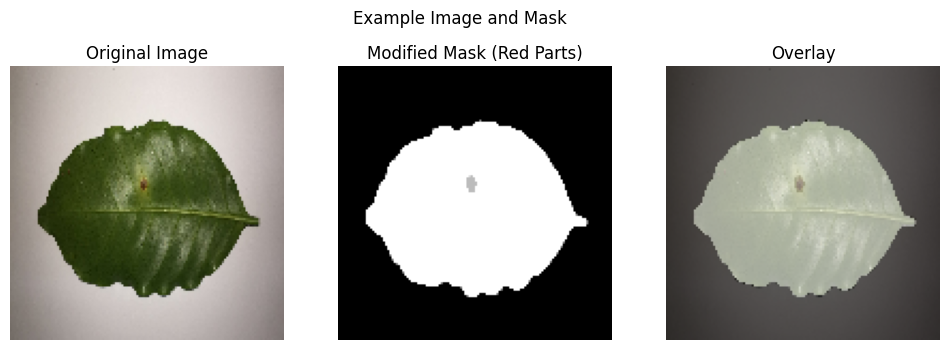

In [52]:
# Function to display images
def display_images(img, mask, title):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask[:, :, 0], cmap='gray')
    plt.title('Modified Mask (Red Parts)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(mask[:, :, 0], cmap='gray')
    plt.imshow(img, alpha=0.4)
    plt.title('Overlay')
    plt.axis('off')

    plt.suptitle(title)
    plt.show()

# Choose an example from the dataset
example = image_mask_dataset.take(4)

# Load and preprocess the example
for img, mask in example:
    img = img.numpy()
    mask = mask.numpy()

# Display the images
display_images(img, mask, 'Example Image and Mask')


In [53]:
def segment_image(image_path, model):
    # Load and preprocess the image using the existing function
    img, _ = load_and_preprocess_image_with_mask(image_path, image_path)  # Use the same image for both image and mask paths

    # Expand dimensions to add batch size
    img = tf.expand_dims(img, axis=0)

    # Predict the segmentation mask
    predictions = model.predict(img)

    # Get the segmentation mask
    mask = predictions[0, :, :, 0]

    return mask


# Path to the folder containing images you want to segment
input_folder = '/content/train/'

# Path to the folder where you want to save the segmented masks
output_folder = '/content/segmentation_unit/'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Get a list of image file paths in the input folder
image_files = [os.path.join(input_folder, file) for file in os.listdir(input_folder) if file.endswith('.jpg')]

# Iterate through the images and save the segmented masks
for image_file in image_files:
    # Get the image name without extension
    image_name = os.path.splitext(os.path.basename(image_file))[0]

    # Use the segmentation model to get the mask
    segmented_mask = segment_image(image_file, segmentation_model)



    # Save the binary mask
    output_path = os.path.join(output_folder, f'{image_name}_mask.png')
    cv2.imwrite(output_path, segmented_mask)

print("Segmentation complete. Masks saved in:", output_folder)


1/1 [==============================] - 0s 27ms/step
Segmentation complete. Masks saved in: /content/segmentation_unit/


#Segmentation Evaluation

### iterative threshold Metrics

In [54]:
def calculate_metrics(mask, predicted_mask):
    # Flatten the masks to 1D arrays
    mask_flat = mask.flatten()
    predicted_mask_flat = predicted_mask.flatten()

    # Calculate precision, recall, and f1 score for each class independently
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=UndefinedMetricWarning)
        precision = precision_score(mask_flat, predicted_mask_flat, average=None)
        recall = recall_score(mask_flat, predicted_mask_flat, average=None)
        f1 = f1_score(mask_flat, predicted_mask_flat, average=None)

    return precision, recall, f1

In [55]:
def evaluate_segmentation(input_folder, mask_folder):
    # Initialize counters
    total_tp = 0
    total_fp = 0
    total_fn = 0

    # Loop through each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            # Construct the paths for input image, mask, and output images
            input_image_path = os.path.join(input_folder, filename)
            mask_path = os.path.join(mask_folder, filename.replace('.jpg', '_mask.png'))

            # Load the ground truth mask
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Apply iterative thresholding to the image
            predicted_mask = iterative_thresholding(input_image_path)

            # Calculate metrics
            precision, recall, _ = calculate_metrics(mask, predicted_mask)

            # Accumulate TP, FP, FN counts
            total_tp += np.sum(precision)
            total_fp += np.sum(1 - precision)
            total_fn += np.sum(1 - recall)

    # Calculate overall precision, recall, and F1 score
    overall_precision = total_tp / (total_tp + total_fp)
    overall_recall = total_tp / (total_tp + total_fn)
    overall_f1 = 2 * (overall_precision * overall_recall) / (overall_precision + overall_recall)

    # Print or log the overall metrics
    print(f"Overall Precision: {overall_precision:.4f}, Recall: {overall_recall:.4f}, F1 Score: {overall_f1:.4f}")

In [56]:
# usage:
input_folder_example = '/content/iterative_threshold_output/'
mask_folder_example = '/content/mask/'

evaluate_segmentation(input_folder_example, mask_folder_example)

Overall Precision: 0.1560, Recall: 0.1687, F1 Score: 0.1621


### Kmeans metrics

In [57]:
def calculate_metrics_for_class(mask, predicted_mask, class_index):
    # Flatten the masks to 1D arrays
    mask_flat = (mask == class_index).flatten()
    predicted_mask_flat = (predicted_mask == class_index).flatten()

    # Calculate precision, recall, and f1 score for the specified class
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=UndefinedMetricWarning)
        precision = precision_score(mask_flat, predicted_mask_flat, average='binary')
        recall = recall_score(mask_flat, predicted_mask_flat, average='binary')
        f1 = f1_score(mask_flat, predicted_mask_flat, average='binary')

    return precision, recall, f1

In [58]:
def evaluate_segmentation(input_folder, mask_folder, cluster_index):
    # Initialize counters
    total_tp = 0
    total_fp = 0
    total_fn = 0

    # Loop through each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            # Construct the paths for input image, mask, and output images
            input_image_path = os.path.join(input_folder, filename)
            mask_path = os.path.join(mask_folder, filename.replace('.jpg', f'_mask.png'))
            # Load the ground truth mask
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Apply iterative thresholding to the image for the specified cluster
            predicted_mask = iterative_thresholding(input_image_path, cluster_index)

            # Check if the mask is None
            if mask is None:
                print(f"Error: Failed to load mask for {filename}")
                continue

            # Calculate metrics
            precision, recall, _ = calculate_metrics(mask, predicted_mask)

            # Accumulate TP, FP, FN counts
            total_tp += np.sum(precision)
            total_fp += np.sum(1 - precision)
            total_fn += np.sum(1 - recall)

    # Calculate overall precision, recall, and F1 score
    overall_precision = total_tp / (total_tp + total_fp)
    overall_recall = total_tp / (total_tp + total_fn)
    overall_f1 = 2 * (overall_precision * overall_recall) / (overall_precision + overall_recall)

    # Print or log the overall metrics for the specified cluster
    print(f"Cluster {cluster_index} - Overall Precision: {overall_precision:.4f}, Recall: {overall_recall:.4f}, F1 Score: {overall_f1:.4f}")

# Example usage for cluster 3:
input_folder_example = '/content/K_means_segmentation/'
mask_folder_example = '/content/mask/'
cluster_index_example = 3
evaluate_segmentation(input_folder_example, mask_folder_example, cluster_index_example)

Cluster 3 - Overall Precision: 0.0978, Recall: 0.1023, F1 Score: 0.1000


| Segmentation Method | Precision | Recall | F1 Score |
|----------------------|-----------|--------|----------|
| Iterative Thresholding|  0.1560  | 0.1687 |   0.1621 |
| K-Means Segmentation |    0.2354   | 0.2624 |  0.2482 |


# New  Evaluation of the Segmentation Results

The metric is defined by the Recognition Working Group (Automatic Target Recognition Working Group (ATRWG).

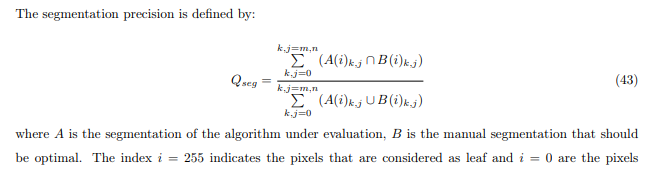

In [59]:

def segmentation_precision(A, B):
    # Calculate intersection and union for each pixel
    intersection = np.logical_and(A, B)
    union = np.logical_or(A, B)

    # Sum the intersections and unions over all pixels
    total_intersection = np.sum(intersection)
    total_union = np.sum(union)

    # Calculate segmentation precision
    Qseg = total_intersection / total_union if total_union > 0 else 0

    return Qseg

def calculate_overall_segmentation_precision(input_folder, manual_folder):
    total_Qseg = 0
    total_images = 0

    # Loop through each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            total_images += 1

            # Construct the paths for the algorithm's segmentation and manual segmentation masks
            algorithm_segmentation_path = os.path.join(input_folder, filename)
            manual_segmentation_path = os.path.join(manual_folder, filename.replace('.jpg', '_mask.png'))

            # Load the algorithm's segmentation result A and the manual segmentation B as binary masks
            A = cv2.imread(algorithm_segmentation_path, cv2.IMREAD_GRAYSCALE)
            B = cv2.imread(manual_segmentation_path, cv2.IMREAD_GRAYSCALE)

            # Threshold the images to binary masks (if they are not binary already)
            _, A = cv2.threshold(A, 1, 255, cv2.THRESH_BINARY)
            _, B = cv2.threshold(B, 1, 255, cv2.THRESH_BINARY)

            # Apply the segmentation precision metric for each image
            Qseg = segmentation_precision(A, B)

            # Accumulate the segmentation precision for all images
            total_Qseg += Qseg

    # Calculate the overall segmentation precision
    overall_Qseg = total_Qseg / total_images if total_images > 0 else 0

    print(f"Overall Segmentation Precision (Qseg): {overall_Qseg:.4f}")

In [60]:
# Example usage:
input_folder_example = '/content/K_means_segmentation_overlay/'
manual_folder_example = '/content/mask/'
calculate_overall_segmentation_precision(input_folder_example, manual_folder_example)

Overall Segmentation Precision (Qseg): 0.9449


In [61]:
# Example usage:
input_folder_example = '/content/iterative_threshold_output/'
manual_folder_example = '/content/mask/'
calculate_overall_segmentation_precision(input_folder_example, manual_folder_example)

Overall Segmentation Precision (Qseg): 0.8674


In [66]:
def calculate_Qseg(segmentation_A, segmentation_B):
    # Ensure both segmentations have the same shape
    assert segmentation_A.shape == segmentation_B.shape, "Segmentations must have the same shape"

    # Set index values
    i_leaf = 255
    i_background = 0

    # Create binary masks for leaf pixels
    mask_A_leaf = (segmentation_A == i_leaf)
    mask_B_leaf = (segmentation_B == i_leaf)

    # Create binary masks for background pixels
    mask_A_background = (segmentation_A == i_background)
    mask_B_background = (segmentation_B == i_background)

    # Calculate the intersection and union for leaf pixels
    intersection_leaf = np.logical_and(mask_A_leaf, mask_B_leaf)
    union_leaf = np.logical_or(mask_A_leaf, mask_B_leaf)

    # Calculate the intersection and union for background pixels
    intersection_background = np.logical_and(mask_A_background, mask_B_background)
    union_background = np.logical_or(mask_A_background, mask_B_background)

    # Calculate Qseg for leaf and background separately
    Qseg_leaf = np.sum(intersection_leaf) / np.sum(union_leaf) if np.sum(union_leaf) != 0 else 1.0
    Qseg_background = np.sum(intersection_background) / np.sum(union_background) if np.sum(union_background) != 0 else 1.0

    # Calculate the overall Qseg as the average of leaf and background Qseg
    Qseg = (Qseg_leaf + Qseg_background) / 2.0

    return Qseg

# Specify the folder where you want to save the segmented images
save_folder = '/content/segmentation_results'

# Create the folder if it doesn't exist
os.makedirs(save_folder, exist_ok=True)

# Initialize variables for overall Qseg calculation
total_intersection_leaf = 0
total_union_leaf = 0
total_intersection_background = 0
total_union_background = 0

# Fetch a batch of validation data
for images, labels in validation_dataset.take(1):
    # Make predictions using the trained model
    predictions = segmentation_model.predict(images)

    # Iterate through the batch
    for i in range(len(images)):
        # Calculate intersection and union for the current segmentation
        intersection_leaf = np.sum(np.logical_and(predictions[i][:, :, 0] == 255, labels[i][:, :, 0] == 255))
        union_leaf = np.sum(np.logical_or(predictions[i][:, :, 0] == 255, labels[i][:, :, 0] == 255))

        intersection_background = np.sum(np.logical_and(predictions[i][:, :, 0] == 0, labels[i][:, :, 0] == 0))
        union_background = np.sum(np.logical_or(predictions[i][:, :, 0] == 0, labels[i][:, :, 0] == 0))

        # Accumulate values for overall Qseg calculation
        total_intersection_leaf += intersection_leaf
        total_union_leaf += union_leaf
        total_intersection_background += intersection_background
        total_union_background += union_background

        # Convert the prediction array to an image
        prediction_image = Image.fromarray((predictions[i][:, :, 0] * 255).astype(np.uint8))

        # Save the image to the specified folder with a unique name
        save_path = os.path.join(save_folder, f'result_{i}.png')
        prediction_image.save(save_path)

        plt.close()  # Close the figure to avoid memory issues

# Calculate overall Qseg
Qseg_leaf = total_intersection_leaf / total_union_leaf if total_union_leaf != 0 else 1.0
Qseg_background = total_intersection_background / total_union_background if total_union_background != 0 else 1.0
Qseg = (Qseg_leaf + Qseg_background) / 2.0

# Print the overall Qseg result
print(f"Overall Qseg: {Qseg}")


1/1 [==============================] - 0s 111ms/step
Overall Qseg: 0.5


# Severity Calculation

In [67]:
def calculate_severity(segmented_image):
    # Define the range of red colors for damaged spots
    lower_red = np.array([0, 0, 100], dtype=np.uint8)
    upper_red = np.array([100, 100, 255], dtype=np.uint8)

    # Create a binary mask for damaged area
    damaged_mask = cv2.inRange(segmented_image, lower_red, upper_red)

    # Create a binary mask for non-damaged (leaf) area
    leaf_mask = ~damaged_mask  # Invert the damaged_mask

    # Calculate area of damaged and total leaf in pixels
    damaged_area_pixels = np.sum(damaged_mask)
    total_leaf_area_pixels = np.sum(leaf_mask)

    # Calculate severity
    severity = (damaged_area_pixels / total_leaf_area_pixels) * 100 if total_leaf_area_pixels > 0 else 0

    return severity

def evaluate_severity(input_folder):
    # Create an empty DataFrame to store results
    results_df = pd.DataFrame(columns=['ImageName', 'Severity'])

    # Loop through each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            # Construct the path for the segmented image
            segmented_image_path = os.path.join(input_folder, filename)

            # Load the segmented image
            segmented_image = cv2.imread(segmented_image_path)

            # Calculate severity
            severity = calculate_severity(segmented_image)

            # Append results to DataFrame
            results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)

            print(f"Severity for {filename}: {severity:.2f}%")

    return results_df

# usage:
input_folder_example = '/content/iterative_threshold_output'
evaluate_severity(input_folder_example)


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 21.jpg: 4.77%
Severity for 349.jpg: 0.79%
Severity for 1680.jpg: 0.02%
Severity for 1016.jpg: 0.04%
Severity for 866.jpg: 0.25%


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 268.jpg: 0.55%
Severity for 2.jpg: 0.90%
Severity for 242.jpg: 1.18%
Severity for 419.jpg: 1.06%
Severity for 371.jpg: 1.89%
Severity for 488.jpg: 1.57%


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 1034.jpg: 0.82%
Severity for 330.jpg: 0.93%
Severity for 395.jpg: 0.38%
Severity for 1074.jpg: 1.03%
Severity for 771.jpg: 0.43%


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 218.jpg: 0.02%
Severity for 992.jpg: 209.44%
Severity for 712.jpg: 2.70%
Severity for 1643.jpg: 0.72%
Severity for 627.jpg: 237.46%


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 68.jpg: 0.53%
Severity for 1541.jpg: 0.04%
Severity for 443.jpg: 0.84%
Severity for 1383.jpg: 0.14%
Severity for 47.jpg: 1.02%


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 960.jpg: 197.19%
Severity for 1705.jpg: 0.02%
Severity for 694.jpg: 205.79%
Severity for 828.jpg: 0.53%
Severity for 529.jpg: 0.70%


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 1573.jpg: 0.21%
Severity for 146.jpg: 0.68%
Severity for 680.jpg: 0.04%
Severity for 901.jpg: 1.76%
Severity for 1105.jpg: 0.06%
Severity for 742.jpg: 0.36%
Severity for 1413.jpg: 0.83%
Severity for 1481.jpg: 0.40%
Severity for 446.jpg: 267.07%
Severity for 792.jpg: 0.08%
Severity for 1201.jpg: 180.79%


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 1612.jpg: 0.14%
Severity for 88.jpg: 1.73%
Severity for 1449.jpg: 0.08%
Severity for 628.jpg: 1.58%
Severity for 1517.jpg: 0.01%
Severity for 291.jpg: 1.42%

<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a


Severity for 862.jpg: 0.57%
Severity for 566.jpg: 0.05%


<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-67-d12a4cb4e2f1>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)


,ImageName,Severity
0,21.jpg,4.769018
1,349.jpg,0.786578
2,1680.jpg,0.017503
3,1016.jpg,0.044461
4,866.jpg,0.245505
5,268.jpg,0.552061
6,2.jpg,0.902815
7,242.jpg,1.175275
8,419.jpg,1.059628
9,371.jpg,1.894854


In [68]:
def calculate_severity(segmented_image):
    # Define the range of blue colors for damaged spots
    lower_blue = np.array([100, 0, 0], dtype=np.uint8)
    upper_blue = np.array([255, 100, 100], dtype=np.uint8)

    # Create a binary mask for damaged area
    damaged_mask = cv2.inRange(segmented_image, lower_blue, upper_blue)

    # Create a binary mask for non-damaged (leaf) area
    leaf_mask = ~damaged_mask  # Invert the damaged_mask

    # Calculate area of damaged and total leaf in pixels
    damaged_area_pixels = np.sum(damaged_mask)
    total_leaf_area_pixels = np.sum(leaf_mask)

    # Calculate severity
    severity = (damaged_area_pixels / total_leaf_area_pixels) * 100 if total_leaf_area_pixels > 0 else 0

    return severity

def evaluate_severity(input_folder):
    # Create an empty DataFrame to store results
    results_df = pd.DataFrame(columns=['ImageName', 'Severity'])

    # Loop through each file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            # Construct the path for the segmented image
            segmented_image_path = os.path.join(input_folder, filename)

            # Load the segmented image
            segmented_image = cv2.imread(segmented_image_path)

            # Calculate severity
            severity = calculate_severity(segmented_image)

            # Append results to DataFrame
            results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)

            print(f"Severity for {filename}: {severity:.2f}%")

    return results_df

In [69]:
# usage:
input_folder_example = '/content/K_means_segmentation_overlay'
results_dataframe = evaluate_severity(input_folder_example)

<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 21.jpg: 13.84%
Severity for 349.jpg: 7.08%
Severity for 1680.jpg: 37.53%
Severity for 1016.jpg: 0.53%
Severity for 866.jpg: 1.47%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 268.jpg: 1.02%
Severity for 2.jpg: 0.97%
Severity for 242.jpg: 2.56%
Severity for 419.jpg: 2.98%
Severity for 371.jpg: 7.56%
Severity for 488.jpg: 9.88%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 1034.jpg: 21.40%
Severity for 330.jpg: 1.52%
Severity for 395.jpg: 1.04%
Severity for 1074.jpg: 2.43%
Severity for 771.jpg: 3.74%
Severity for 218.jpg: 2.19%
Severity for 992.jpg: 0.01%
Severity for 712.jpg: 17.17%
Severity for 1643.jpg: 2.63%
Severity for 627.jpg: 0.12%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 68.jpg: 1.84%
Severity for 1541.jpg: 2.48%
Severity for 443.jpg: 6.72%
Severity for 1383.jpg: 6.83%
Severity for 47.jpg: 11.41%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 960.jpg: 0.00%
Severity for 1705.jpg: 8.66%
Severity for 694.jpg: 0.12%
Severity for 828.jpg: 2.67%
Severity for 529.jpg: 2.50%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 1573.jpg: 14.78%
Severity for 146.jpg: 2.78%
Severity for 680.jpg: 0.94%
Severity for 901.jpg: 8.13%
Severity for 1105.jpg: 3.36%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 742.jpg: 4.73%
Severity for 1413.jpg: 16.88%
Severity for 1481.jpg: 2.84%
Severity for 446.jpg: 0.04%
Severity for 792.jpg: 10.68%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 1201.jpg: 0.09%
Severity for 1612.jpg: 1.41%
Severity for 88.jpg: 3.28%
Severity for 1449.jpg: 7.94%
Severity for 628.jpg: 2.71%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.a

Severity for 1517.jpg: 6.00%
Severity for 291.jpg: 8.19%
Severity for 862.jpg: 14.56%
Severity for 566.jpg: 1.31%


<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)
<ipython-input-68-8022bf2dc56f>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'ImageName': filename, 'Severity': severity}, ignore_index=True)


In [70]:
# Print the DataFrame
print(results_dataframe)

   ImageName   Severity
0     21.jpg  13.835152
1    349.jpg   7.078515
2   1680.jpg  37.527994
3   1016.jpg   0.533214
4    866.jpg   1.465016
5    268.jpg   1.021656
6      2.jpg   0.966551
7    242.jpg   2.564965
8    419.jpg   2.975466
9    371.jpg   7.561480
10   488.jpg   9.879822
11  1034.jpg  21.395771
12   330.jpg   1.522731
13   395.jpg   1.042196
14  1074.jpg   2.434562
15   771.jpg   3.742472
16   218.jpg   2.190629
17   992.jpg   0.009776
18   712.jpg  17.170261
19  1643.jpg   2.630166
20   627.jpg   0.118682
21    68.jpg   1.836468
22  1541.jpg   2.478961
23   443.jpg   6.717038
24  1383.jpg   6.832723
25    47.jpg  11.410723
26   960.jpg   0.004101
27  1705.jpg   8.662696
28   694.jpg   0.116436
29   828.jpg   2.671870
30   529.jpg   2.497944
31  1573.jpg  14.784823
32   146.jpg   2.783531
33   680.jpg   0.940260
34   901.jpg   8.128654
35  1105.jpg   3.356655
36   742.jpg   4.731660
37  1413.jpg  16.881296
38  1481.jpg   2.837562
39   446.jpg   0.036921
40   792.jpg  10

# Resultat

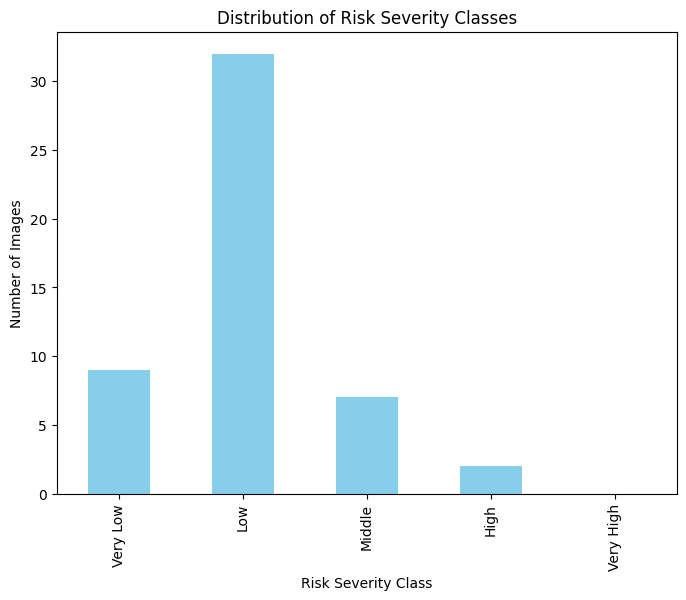

In [71]:
# Create a new column 'RiskSeverityClass' based on the defined ranges
results_dataframe['RiskSeverityClass'] = pd.cut(results_dataframe['Severity'], bins=[-float('inf'), 1, 10, 20, 40, 100], labels=['Very Low', 'Low', 'Middle', 'High', 'Very High'])

# Plot the distribution of risk severity classes
plt.figure(figsize=(8, 6))
results_dataframe['RiskSeverityClass'].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title('Distribution of Risk Severity Classes')
plt.xlabel('Risk Severity Class')
plt.ylabel('Number of Images')
plt.show()

| Segmentation Method | Qseg |
|----------------------|-----------|
| Iterative Thresholding| 0.9449  |
| K-Means Segmentation |   0.8674  |  
|U-net|0.5|


les résultats montrent que la méthode d'itération de seuillage a obtenu la meilleure précision de segmentation avec un Qseg de 0,9449, indiquant une segmentation très précise des zones d'intérêt. En revanche, la méthode de segmentation K-Means a obtenu un Qseg légèrement inférieur de 0,8674, ce qui suggère une précision un peu moindre. Le modèle U-Net semble avoir une précision de segmentation de 0,5, ce qui peut indiquer une performance médiocre ou la nécessité d'ajustements.

Les résultats de l'évaluation de la sévérité des maladies foliaires, exprimés en pourcentage de dommages par rapport à la surface totale de la feuille, sont présentés dans le tableau. Les valeurs de sévérité varient, allant de 0,53% à 37,53%, ce qui indique une diversité dans l'étendue des dommages observés sur les feuilles d'échantillons.